# Video Game Dataset

Analysis on the video game dataset to gain business insights. 

## Exploring the Data

In [29]:
import pandas as pd
import numpy as np

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import MinMaxScaler, LabelEncoder, OneHotEncoder, KBinsDiscretizer
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.metrics import accuracy_score

from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.metrics import r2_score

import matplotlib.pyplot as plt
%matplotlib inline

vgsales = pd.read_excel('vgsales_v5.xlsx')


In [2]:
vgsales.head()

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Years_In_Market,Avg_Annual_Sales,Year_1_Sales,First_Party,Platform_Type
0,1,Wii Sports,Wii,2006,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74,10,8.274000,53.7810,Nintendo,Console
1,2,Super Mario Bros.,NES,1985,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,31,1.298065,26.1560,Nintendo,Console
2,3,Mario Kart Wii,Wii,2008,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82,8,4.477500,23.2830,Nintendo,Console
3,4,Wii Sports Resort,Wii,2009,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00,7,4.714286,21.4500,Nintendo,Console
4,5,Pokemon Red/Pokemon Blue,GB,1996,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,20,1.568500,20.3905,Nintendo,HH


In [3]:
vgsales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15979 entries, 0 to 15978
Data columns (total 16 columns):
Rank                15979 non-null int64
Name                15979 non-null object
Platform            15979 non-null object
Year                15979 non-null int64
Genre               15979 non-null object
Publisher           15945 non-null object
NA_Sales            15979 non-null float64
EU_Sales            15979 non-null float64
JP_Sales            15979 non-null float64
Other_Sales         15979 non-null float64
Global_Sales        15979 non-null float64
Years_In_Market     15979 non-null int64
Avg_Annual_Sales    15979 non-null float64
Year_1_Sales        15979 non-null float64
First_Party         15979 non-null object
Platform_Type       15979 non-null object
dtypes: float64(7), int64(3), object(6)
memory usage: 2.0+ MB


In [4]:
vgsales.describe()

,Rank,Year,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Years_In_Market,Avg_Annual_Sales,Year_1_Sales
count,15979.000000,15979.000000,15979.00000,15979.000000,15979.000000,15979.000000,15979.000000,15979.000000,15979.000000,15979.000000
mean,7991.070593,2006.197071,0.26976,0.149093,0.079514,0.048892,0.547537,9.802929,0.087326,0.355899
std,4613.123753,5.714810,0.82956,0.512557,0.314536,0.191612,1.580275,5.714810,0.323913,1.027179
min,1.000000,1980.000000,0.00000,0.000000,0.000000,0.000000,0.010000,1.000000,0.000417,0.006500
25%,3996.500000,2003.000000,0.00000,0.000000,0.000000,0.000000,0.060000,6.000000,0.007500,0.039000
50%,7991.000000,2007.000000,0.08000,0.020000,0.000000,0.010000,0.180000,9.000000,0.020909,0.117000
75%,11985.500000,2010.000000,0.24000,0.110000,0.040000,0.040000,0.490000,13.000000,0.060000,0.318500
max,15981.000000,2015.000000,41.49000,29.020000,10.220000,10.570000,82.740000,36.000000,14.240000,53.781000


In [5]:
vgsales.isnull().any()

Rank                False
Name                False
Platform            False
Year                False
Genre               False
Publisher            True
NA_Sales            False
EU_Sales            False
JP_Sales            False
Other_Sales         False
Global_Sales        False
Years_In_Market     False
Avg_Annual_Sales    False
Year_1_Sales        False
First_Party         False
Platform_Type       False
dtype: bool

### Analysis of Global Sales with other attributes
Here the Global Sales is plotted on the y axis, with the other attributes on the x axis. It can be seen clearly observed that:
* North american and europe sales are similar.
* Year 1 sales has a direct relationship with Global Sales (they are identical).
* Japan is the most different market.  

The pie chart shows that:
* Almost 50% of sales come from North America - so that is the biggest market.
* 27.2% of sales come from Europe.

From the bar plots it is clear that:
* Platform, Genre and Platform Type are good indicators of what is popular globally.
* In platform type - Console is a huge percentage of the total.
* The top 3-5 publishers make up 99% of the total sales. 

In [6]:
fig = make_subplots(rows=3, cols=2, start_cell="top-left", 
                    subplot_titles=("NA_Sales vs Global Sales", "EU_Sales vs Global Sales", "JP_Sales vs Global Sales", "Other_Sales vs Global_Sales", "Genre", "Platform Type"))

fig.add_trace(go.Scatter(x=vgsales["NA_Sales"], y=vgsales["Global_Sales"], mode="markers"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=vgsales["EU_Sales"], y=vgsales["Global_Sales"], mode="markers"),
              row=1, col=2)

fig.add_trace(go.Scatter(x=vgsales["JP_Sales"], y=vgsales["Global_Sales"], mode="markers"),
              row=2, col=1)

fig.add_trace(go.Scatter(x=vgsales["Other_Sales"], y=vgsales["Global_Sales"], mode="markers"),
              row=2, col=2)

fig.add_trace(go.Scatter(x=vgsales["Genre"], y=vgsales["Global_Sales"], mode="markers"),
              row=3, col=1)

fig.add_trace(go.Scatter(x=vgsales["Platform_Type"], y=vgsales["Global_Sales"], mode="markers"),
              row=3, col=2)



fig.show()

In [7]:
df = vgsales[["NA_Sales", "EU_Sales", "JP_Sales", "Other_Sales"]]
df = df.sum().reset_index()
fig = px.pie(df, values=0, names='index', title = 'Video Game - Share of Sales by Region')

fig.show()


In [8]:
for label in ["First_Party", "Genre", "Platform_Type"]:
    df = vgsales[[label, "Global_Sales"]]
    df = df.groupby(label).sum().reset_index().sort_values('Global_Sales', ascending=False)
    fig = px.bar(df, x=label, y="Global_Sales")
    fig.show()

# Linear Regression Models

## Model 1
Predicting global sales using data from EU and JP sales only. This would give a good idea about how the global market performs. Reduces the risk, as initial testing data can be used to predict North American sales which makes up 50% of the total sales.  

Independent Variables: NA_Sales, Year_1_Sales  
Dependent Variable: Global_Sales


In [9]:
# Note: adding year 1 sales leads to 100% accuracy which we dont want

y = vgsales["Global_Sales"]

features = ["EU_Sales", "NA_Sales"]
X = vgsales[features]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

regressor = LinearRegression()  
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

# Using the mean-squared error
error = metrics.mean_squared_error(y_test, y_pred)
print("Error:", error)

#NA & EU Sales combination gives you the lowest error

Error: 0.10364259901960364


In [10]:
fig = go.Figure()
# fig.add_trace(go.Scatter(x=y_test.index, y=y_test, mode="markers", name="Actual"))
fig.add_trace(go.Scatter(x=y_test, y=y_pred, mode="markers", name="Predicted"))
fig.show()

# Ideal case, the graph would be a perfectly straight line. 

## Model 2

Predicting global sales using platform type and Europe sales only. This is useful because 25% of the total sales (EU_Sales) can be used give a good prediction of the total sales all around the world. Great to launch a new product and test it out in a smaller market. 

Independent Variables: Platform_Type, EU_Sales
Dependent Variable: Global_Sales

In [11]:
# Linear Regression 2 - Platform type and EU Sales

y = vgsales["Global_Sales"]
# One-hot encoding Platform_Type - since this is categorical 
X = pd.concat([pd.get_dummies(vgsales["Platform_Type"]),vgsales["EU_Sales"]], axis=1, sort=False)
              

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
regressor = LinearRegression()  
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

error = metrics.mean_squared_error(y_test, y_pred)
print("Error:", error)

Error: 0.35553487495465924


In [12]:
# Linear Regression 2 - NA & EU Sales

y = vgsales["Global_Sales"]
# One-hot encoding Platform_Type - since this is categorical
X = pd.concat([vgsales["NA_Sales"],vgsales["EU_Sales"]], axis=1, sort=False)
              

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
regressor = LinearRegression()  
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

error = metrics.mean_squared_error(y_test, y_pred)
print("Error:", error)
print("mse:",mean_squared_error(y_test, y_pred))
print("rmse:", sqrt(mean_squared_error(y_test, y_pred)))
print("r-squared:", r2_score(y_test, y_pred))


Error: 0.10364259901960311
mse: 0.10364259901960311
rmse: 0.3219357063446102
r-squared: 0.9761963344967661


In [13]:
# Linear Regression Publisher
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.metrics import r2_score


y = vgsales["Global_Sales"]
# One-hot encoding Platform_Type - since this is categorical 
X = pd.get_dummies(vgsales["Publisher"])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
regressor = LinearRegression()  
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

error = metrics.mean_squared_error(y_test, y_pred)
print("Error:", error)

print("mse:",mean_squared_error(y_test, y_pred))
print("rmse:", sqrt(mean_squared_error(y_test, y_pred)))
print("r-squared:", r2_score(y_test, y_pred))


Error: 6.544396563379785e+25
mse: 6.544396563379785e+25
rmse: 8089744472713.452
r-squared: -1.503055965296092e+25


In [14]:
# Linear Regression Platform Type
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.metrics import r2_score


y = vgsales["Global_Sales"]
# One-hot encoding Platform_Type - since this is categorical 
X = pd.get_dummies(vgsales["Platform_Type"])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
regressor = LinearRegression()  
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

error = metrics.mean_squared_error(y_test, y_pred)
print("Error:", error)

print("mse:",mean_squared_error(y_test, y_pred))
print("rmse:", sqrt(mean_squared_error(y_test, y_pred)))
print("r-squared:", r2_score(y_test, y_pred))


Error: 4.342202136164479
mse: 4.342202136164479
rmse: 2.0837951281650695
r-squared: 0.0027235116215400534


In [15]:
# Linear Regression First Party
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.metrics import r2_score


y = vgsales["Global_Sales"]
# One-hot encoding Platform_Type - since this is categorical 
X = pd.get_dummies(vgsales["First_Party"])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
regressor = LinearRegression()  
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

error = metrics.mean_squared_error(y_test, y_pred)
print("Error:", error)

print("mse:",mean_squared_error(y_test, y_pred))
print("rmse:", sqrt(mean_squared_error(y_test, y_pred)))
print("r-squared:", r2_score(y_test, y_pred))


Error: 4.347176088549408
mse: 4.347176088549408
rmse: 2.084988270602357
r-squared: 0.0015811406281470708


In [16]:
# Linear Regression Genre
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.metrics import r2_score


y = vgsales["Global_Sales"]
# One-hot encoding Platform_Type - since this is categorical 
X = pd.get_dummies(vgsales["Genre"])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
regressor = LinearRegression()  
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

error = metrics.mean_squared_error(y_test, y_pred)
print("Error:", error)

print("mse:",mean_squared_error(y_test, y_pred))
print("rmse:", sqrt(mean_squared_error(y_test, y_pred)))
print("r-squared:", r2_score(y_test, y_pred))


Error: 4.334773999462676
mse: 4.334773999462676
rmse: 2.0820120075212527
r-squared: 0.004429536779482768


In [17]:
# Linear Regression Genre & Platform
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.metrics import r2_score


y = vgsales["Global_Sales"]
# One-hot encoding Platform_Type - since this is categorical 
X = pd.concat([pd.get_dummies(vgsales["Genre"]), pd.get_dummies(vgsales["Platform_Type"])], axis=1, sort=False)                                                         

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
regressor = LinearRegression()  
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

error = metrics.mean_squared_error(y_test, y_pred)
print("Error:", error)

print("mse:",mean_squared_error(y_test, y_pred))
print("rmse:", sqrt(mean_squared_error(y_test, y_pred)))
print("r-squared:", r2_score(y_test, y_pred))


Error: 4.326471853229012
mse: 4.326471853229012
rmse: 2.0800172723391053
r-squared: 0.006336296295111121


In [18]:
fig = go.Figure()
# fig.add_trace(go.Scatter(x=y_test.index, y=y_test, mode="markers", name="Actual"))
fig.add_trace(go.Scatter(x=y_test, y=y_pred, mode="markers", name="Predicted"))
fig.show()

In [19]:
#Using the Genre and Years in market, we predict the platform type. This gives an insight into what platforms have been in the market for the longest, and also helps to analyze the relationship between Genre and Platform Type. This can be useful when releasing a game on a new platform or maybe innovating platform types.

#Features: Genre, Years_In_Market
#Predicting: Platform_Type

In [20]:
X = pd.concat([pd.get_dummies(vgsales["Genre"]), vgsales["Years_In_Market"]], axis=1, sort=False)

mmsc = MinMaxScaler()
X["Years_In_Market"] = mmsc.fit_transform(X["Years_In_Market"].values.reshape(-1, 1))

y = vgsales["Platform_Type"]
le = LabelEncoder()
y = le.fit_transform(y.astype('str'))

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

knn = KNeighborsClassifier(n_neighbors=13)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.7252816020025031


## Model 2
Given a Genre and Platform Type we try to predict how well this will do on global sales. This can be used to infer relationships like Action Games on a Console do much better than Action Games on PC.
  
Features: Genre, Platform  
Predicting: Global Sales bracket (discretized to two bins)

In [21]:
from sklearn.metrics import classification_report
X = pd.concat([pd.get_dummies(vgsales["Genre"]), pd.get_dummies(vgsales["Platform_Type"]), pd.get_dummies(vgsales["First_Party"])], axis=1, sort=False)
mmsc = MinMaxScaler()

y = vgsales["Global_Sales"]
disc = KBinsDiscretizer(n_bins=3, encode='ordinal', strategy="quantile")
y = disc.fit_transform(y.values.reshape(-1, 1))
y = np.ravel(y, order='C')

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

knn = KNeighborsClassifier(n_neighbors=15)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

target_names_vgsales = ["Low Sales", "Medium Sales", "High Sales"]
print(classification_report(y_test,y_pred, target_names = target_names_vgsales))
#accuracy much higher with fewer bins because of outliers
#number of neighbors did not have much influence


Accuracy: 0.4120775969962453
              precision    recall  f1-score   support

   Low Sales       0.45      0.40      0.42       978
Medium Sales       0.38      0.23      0.29      1133
  High Sales       0.40      0.61      0.49      1085

    accuracy                           0.41      3196
   macro avg       0.41      0.41      0.40      3196
weighted avg       0.41      0.41      0.40      3196



## Model 2. 
For a given Platform, Platform Type, Genre and Sales form North America, we try to predict the global sales bracker (discretized). This can be useful in analyzing what combinations of these features have a higher chance on success in a global market. 

In [22]:
#Label Encoder for X Variables - better performing model, but should not be using label encoding for our x variables


X = vgsales[["First_Party", "Platform_Type", "Genre"]]
X["First_Party"] = le.fit_transform(vgsales["First_Party"].astype("str"))
X["Platform_Type"] = le.fit_transform(vgsales["Platform_Type"].astype("str"))
X["Genre"] = le.fit_transform(X["Genre"].astype("str"))

y = vgsales["Global_Sales"]
# change n_bins to 2 for 88% acc
disc = KBinsDiscretizer(n_bins=3, encode='ordinal', strategy="quantile")
y = disc.fit_transform(y.values.reshape(-1, 1))
y = np.ravel(y, order='C')

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

clf = DecisionTreeClassifier()
clf = clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)

print("Accuracy:", metrics.accuracy_score(y_test, y_pred))


target_names_vgsales = ["Low Sales", "Medium Sales", "High Sales"]
print(classification_report(y_test,y_pred, target_names = target_names_vgsales))


#the accuracy is relative high because we are breaking the data into 3 equal bins, which eliminates the impact of the outliers
#as you increase the number of bins, the accuracy decreases, if you increast it improves


Accuracy: 0.43147684605757197
              precision    recall  f1-score   support

   Low Sales       0.49      0.43      0.46      1029
Medium Sales       0.37      0.29      0.33      1089
  High Sales       0.43      0.57      0.49      1078

    accuracy                           0.43      3196
   macro avg       0.43      0.43      0.43      3196
weighted avg       0.43      0.43      0.43      3196



C:\Users\kyoun\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kyoun\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kyoun\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/panda

In [23]:
#get dummies for X variables


X = pd.concat([pd.get_dummies(vgsales["Genre"]), pd.get_dummies(vgsales["Platform_Type"]), pd.get_dummies(vgsales["First_Party"])], axis=1, sort=False)

y = vgsales["Global_Sales"]
# change n_bins to 2 for 88% acc
disc = KBinsDiscretizer(n_bins=3, encode='ordinal', strategy="quantile")
y = disc.fit_transform(y.values.reshape(-1, 1))
y = np.ravel(y, order='C')

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

clf = DecisionTreeClassifier()
clf = clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)

target_names_vgsales = ["Low Sales", "Medium Sales", "High Sales"]

print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

print(classification_report(y_test,y_pred, target_names = target_names_vgsales))

#the accuracy is relative high because we are breaking the data into 3 equal bins, which eliminates the impact of the outliers
#as you increase the number of bins, the accuracy decreases, if you increast it improves


Accuracy: 0.44399249061326657
              precision    recall  f1-score   support

   Low Sales       0.53      0.44      0.48       995
Medium Sales       0.37      0.31      0.34      1098
  High Sales       0.44      0.58      0.50      1103

    accuracy                           0.44      3196
   macro avg       0.45      0.44      0.44      3196
weighted avg       0.44      0.44      0.44      3196



In [31]:
#decision tree with max depth of 7


X = pd.concat([pd.get_dummies(vgsales["Genre"]), pd.get_dummies(vgsales["Platform_Type"]), pd.get_dummies(vgsales["First_Party"])], axis=1, sort=False)

y = vgsales["Global_Sales"]
# change n_bins to 2 for 88% acc
disc = KBinsDiscretizer(n_bins=3, encode='ordinal', strategy="quantile")
y = disc.fit_transform(y.values.reshape(-1, 1))
y = np.ravel(y, order='C')

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

clf2 = DecisionTreeClassifier(max_depth = 7)
clf2 = clf2.fit(X_train,y_train)
y_pred2 = clf2.predict(X_test)

target_names_vgsales = ["Low Sales", "Medium Sales", "High Sales"]

print("Accuracy:", metrics.accuracy_score(y_test, y_pred2))

print(classification_report(y_test,y_pred2, target_names = target_names_vgsales))

#similar accuracy as first model


Accuracy: 0.43617021276595747
              precision    recall  f1-score   support

   Low Sales       0.49      0.46      0.48       973
Medium Sales       0.40      0.17      0.23      1110
  High Sales       0.42      0.68      0.52      1113

    accuracy                           0.44      3196
   macro avg       0.44      0.44      0.41      3196
weighted avg       0.43      0.44      0.41      3196



In [30]:
#optimize decision tree
accuracy = []


for depth in range(1,51):
    tree_optimal = DecisionTreeClassifier(max_depth = depth)
    tree_optimal.fit(X_train,y_train)
    y_pred_optimal_tree = tree_optimal.predict(X_test) 
    accuracy.append(accuracy_score(y_test, y_pred_optimal_tree))

print(accuracy)

accuracy_df = pd.DataFrame({"Max Depth": range(1,51), "Accuracy": accuracy})
print(accuracy_df)

[0.3804755944931164, 0.43210262828535667, 0.43210262828535667, 0.4399249061326658, 0.4421151439299124, 0.4427409261576971, 0.4446182728410513, 0.44180225281602004, 0.44367959949937424, 0.44336670838548187, 0.4446182728410513, 0.445244055068836, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657, 0.44399249061326657,

[[1.]
 [1.]
 [1.]
 ...
 [0.]
 [0.]
 [0.]]
[array([0., 1., 2.])]


C:\Users\kyoun\Anaconda3\lib\site-packages\sklearn\preprocessing\_discretization.py:193: UserWarning:

Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.



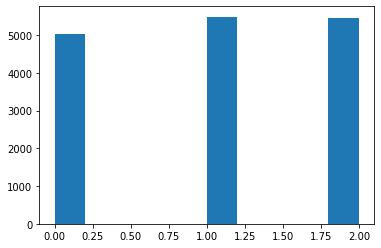

In [24]:
print(disc.fit_transform(y.reshape(-1, 1)))
print(disc.bin_edges_)

# histogram of the transformed data
plt.hist(y)
plt.show()

In [25]:
feature_names_vgsales = list(X.columns)
feature_names_vgsales

class_names_vgsales = ["Low Sales", "Med Sales", "High Sales"]
class_names_vgsales

['Low Sales', 'Med Sales', 'High Sales']

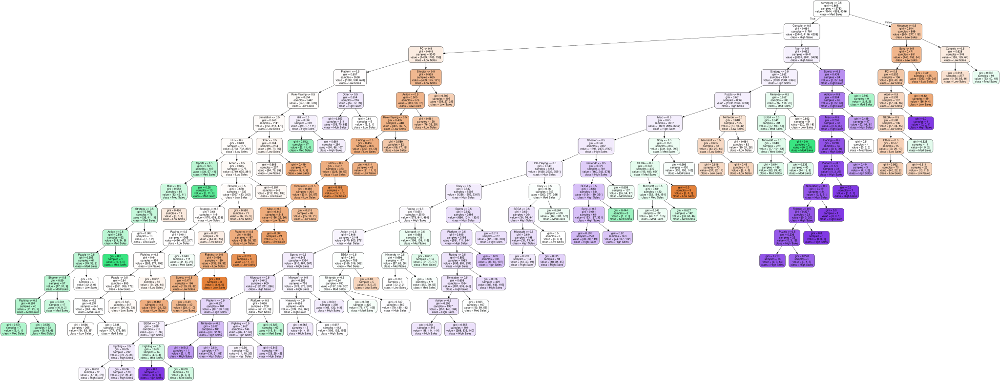

In [26]:
#Plotting the Tree

import os

#from github, author's code
# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Where to save the figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "decision_trees"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID)
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

#based on code from book, Chapter 7, page 176
#Source added after reviewing code on Github

from graphviz import Source
from sklearn.tree import export_graphviz

export_graphviz(
        clf,
        out_file=os.path.join(IMAGES_PATH, "vgsales_tree.dot"),
        feature_names = feature_names_vgsales,
        class_names = class_names_vgsales,
        rounded = True,
        filled = True
)

Source.from_file(os.path.join(IMAGES_PATH, "vgsales_tree.dot"))

C:\Users\kyoun\Anaconda3\lib\site-packages\sklearn\externals\six.py:31: DeprecationWarning:

The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).



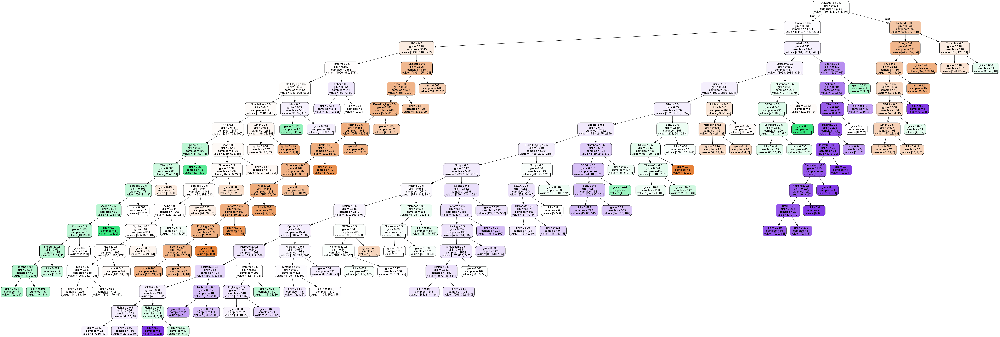

In [27]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()

export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_names_vgsales, class_names = class_names_vgsales)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())


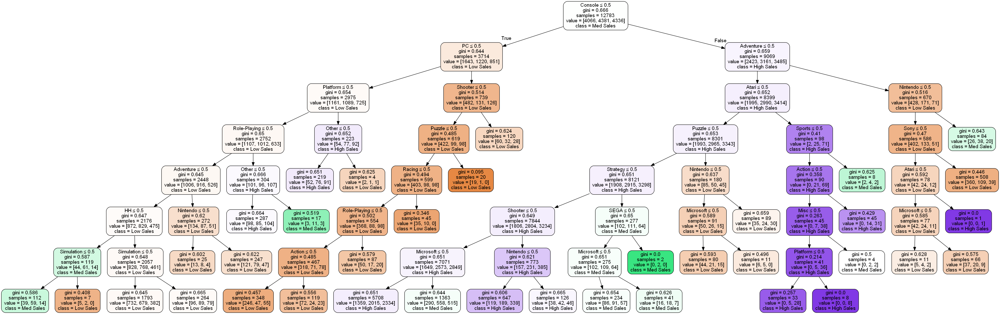

In [32]:
#decision tree viz with 7 layers

from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()

export_graphviz(clf2, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_names_vgsales, class_names = class_names_vgsales)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())
